# Description

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import optimizers, losses
!pip install tensorflowjs --quiet
import tensorflowjs as tfjs

import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cv2

from datetime import datetime
from tqdm.auto import tqdm
import time
import random
import os
import math
import pathlib
import uuid
import imageio
import IPython
import os
import itertools
import shutil

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-cudf 21.12.2 requires cupy-cuda115, which is not installed.
cudf 21.12.2 requires cupy-cuda115, which is not installed.
tfx-bsl 1.12.0 requires google-api-python-client<2,>=1.7.11, but you have google-api-python-client 2.79.0 which is incompatible.
tfx-bsl 1.12.0 requires pyarrow<7,>=6, but you have pyarrow 5.0.0 which is incompatible.
tensorflow-transform 1.12.0 requires pyarrow<7,>=6, but you have pyarrow 5.0.0 which is incompatible.
statsmodels 0.13.5 requires packaging>=21.3, but you have packaging 20.9 which is incompatible.
shap 0.41.0 requires packaging>20.9, but you have packaging 20.9 which is incompatible.
pytoolconfig 1.2.5 requires packaging>=22.0, but you have packaging 20.9 which is incompatible.
pytesseract 0.3.10 requires packaging>=21.3, but you have packaging 20.9 which is incompatible.
onnx

In [2]:
!nvidia-smi

Fri Mar 31 15:47:51 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.82.01    Driver Version: 470.82.01    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Hyperparameters

In [3]:
# Canny algorithm params
BLUR_KERNEL = (5, 5)
CANNY_THRESH_LOW = 115
CANNY_THRESH_HIGH = 140

# Directories
MODEL_NAME = "Edges2Cats"
LOG_DIR = '/kaggle/working/logs'
DATA_ROOT_PATH = r"/kaggle/input/cat-dataset"
DATASET_OUTPUT_PATH = r"/kaggle/working/segmented"
FILE_EXTENSION = 'jpg'

# Optimizer params
generator_lr = 2e-4
discriminator_lr = 2e-4
beta1 = 0.5
beta2 = 0.999

# Hyperparameters
KERNEL_INIT_MEAN = 0.0
KERNEL_INIT_STDDEV = 0.02
IMAGE_SIZE = (256, 256)
N_INPUT_CHANNELS = 3
N_OUTPUT_CHANNELS = 3
VALIDATION_SPLIT = 0.01
LAMBDA = 100           # L1 loss multiplier
BATCH_SIZE = 4
IMAGE_LOG_INTERVAL = 500
STEPS = 10000

# Utils

In [4]:
class Image_Utils:
    @staticmethod
    def load_image(path, to_RGB=True):
        image = tf.io.read_file(path)
        image = tf.io.decode_jpeg(image, channels=3)
        return image
    
    @staticmethod
    def resize(images, target_size):
        return tf.image.resize(images ,target_size, method='bilinear')
    
    @staticmethod
    def normalize(images):
        return (tf.cast(images, tf.float32) - 127.5) / 127.5
    
    @staticmethod
    def denormalize_batch(images):
        def denormalize(image):
            return tf.cast((image * 127.5) + 127.5, tf.uint8)
        
        return list(map(denormalize, images))
    
    @staticmethod
    def canny(image, low_thresh=CANNY_THRESH_LOW, high_thresh=CANNY_THRESH_HIGH, blur_kernel=BLUR_KERNEL):
        # Convert to np array
        image = np.array(image, dtype=np.uint8)
        
        # Convert to grayscale
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        
        # Gaussian low-pas filter
        blurred = cv2.GaussianBlur(image, blur_kernel, 0)

        # Apply the canny algo 
        edges = cv2.Canny(blurred, low_thresh, high_thresh)

        # Convert the background to white
        edges = cv2.bitwise_not(edges)
        
        # Covert back to RGB
        edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
        
        edges = tf.constant(edges, shape=(*IMAGE_SIZE, 3), dtype=tf.float32)
        
        return edges
        
    @staticmethod
    def random_flip(image, probability=0.4):
        do_augment = np.random.uniform(low=0, high=1) < probability
        if do_augment:
            image = tf.image.flip_left_right(image)
        
        return image
    
    @staticmethod
    def random_jitter(image, probability=0.3):
        do_augment = np.random.uniform(low=0, high=1) < probability
        if do_augment:
            # Resizeing to 286 x 286 based on the paper
            image = Image_Utils.resize(image, (286, 286))  
            
            # Random cropping back to 256 x 256
            image = tf.image.random_crop(image, size=[*IMAGE_SIZE, 3])
        
        return image
    
    @staticmethod
    def preprocess(image, augment=True):
        # Resize the image
        image = Image_Utils.resize(image, IMAGE_SIZE)
        
        # Randomly augment
        if augment:
            image = Image_Utils.random_jitter(image)
            image = Image_Utils.random_flip(image)
        
        # Detect the edges using canny
        edges = tf.py_function(Image_Utils.canny, [image], np.float32)
            
        # Normalize the images
        image = Image_Utils.normalize(image)
        edges = Image_Utils.normalize(edges)
        
        return edges, image    # input_image, target_image
        

class Data_Helper:
    @staticmethod
    def randomly_load_from_directory(directory, n_images_to_load, file_extension='jpg'):
        # Scan the directory for images
        directory = pathlib.Path(directory)
        image_paths = list(map(str, list(directory.glob(f"*.{file_extension}"))))

        # Randomly sample and load images form the image_paths
        random.shuffle(image_paths)
        images = [Image_Utils.load_image((image_path)) for image_path in image_paths[0: n_images_to_load]]

        return images
                
    @staticmethod
    def plot(images, titles=None, fig_size=(10, 10), n_cols=8):
        # Check if the images and the titles have the same length
        if titles is not None and len(images) != len(titles):
            raise ValueError("Images and titles must have the same length")

        # Calculate the number of rows required for the figure
        n_rows = math.ceil(len(images) / n_cols)

        # Create the fig
        fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=fig_size)
        for ax, image in zip(axes.flat, images):
            # Detect the cmap automatically
            cmap = 'gray' if image.shape[-1] == 1 else None

            ax.axis("off")
            ax.imshow(image, cmap=cmap)
        
        # Plot
        fig.tight_layout()
        plt.show()

# Segemntation

In [5]:
# Load the segmenter model
path = r"/kaggle/input/unet-based-image-segmentation-in-tensorflow/20230331-102648-UNet.h5"
segmenter = keras.models.load_model(path)

In [6]:
def segment(batch):
    # Resize to match segmenter input shape
    batch_preprocessed = [Image_Utils.resize(img, (128, 128)) for img in batch]
    
    # Preprocess
    batch_preprocessed = Image_Utils.normalize(batch_preprocessed)
    
    # Prediction
    masks = segmenter.predict(batch_preprocessed)
    
    # Postproces
    masks = tf.argmax(masks, axis=-1)
    
    # Convert to binary mask
    masks = tf.where(tf.math.logical_or(masks == 0, masks == 2), 1, 0)
    
    # Dilate the mask to fill any gaps or holes
    kernel = np.ones((5, 5), np.uint8)
    masks = tf.map_fn(lambda x: cv2.dilate(np.array(x, np.uint8), kernel, iterations=1),
                      masks
                     )
    
    masks = tf.expand_dims(masks, axis=-1)
    
    # Resize the masks (128 x 128 => 256 x 256)
    masks = Image_Utils.resize(masks, IMAGE_SIZE)
    
    # Resize (128 x 128 => 256 x 256)
    images = [Image_Utils.resize(img, IMAGE_SIZE) for img in batch]
    
    # Apply the mask
    final_images = tf.where(masks > 0,
                            images,
                            tf.constant([255, 255, 255], dtype=tf.uint8)
                           )
    
    return final_images

In [7]:
# Create the output directory
if os.path.exists(DATASET_OUTPUT_PATH):
    shutil.rmtree(DATASET_OUTPUT_PATH)
    
os.mkdir(DATASET_OUTPUT_PATH)

# Find all the images in the dir
input_data_path = pathlib.Path(DATA_ROOT_PATH)
input_file_paths =  list(input_data_path.glob(f"*/*.{FILE_EXTENSION}"))

# Create a batched dataset of input images for faster segmentation
_batch_size = 1024

# Segment and save all the images
for i in tqdm(range(0, len(input_file_paths), _batch_size)):
    batch_paths = input_file_paths[i: i + _batch_size]
    
    # Load the batch
    batch_images = [Image_Utils.load_image(str(p)) for p in batch_paths]
    
    # Segment
    batch_segmented = segment(batch_images)
    
    # Resize
    batch_resized = Image_Utils.resize(batch_segmented, IMAGE_SIZE)
    
    # save
    for j, segmented in enumerate(batch_resized):
        save_path = os.path.join(DATASET_OUTPUT_PATH, batch_paths[j].name)
        keras.utils.save_img(save_path, segmented)

  0%|          | 0/10 [00:00<?, ?it/s]

25/25 [==============================] - 2s 67ms/step


# Data Visualization

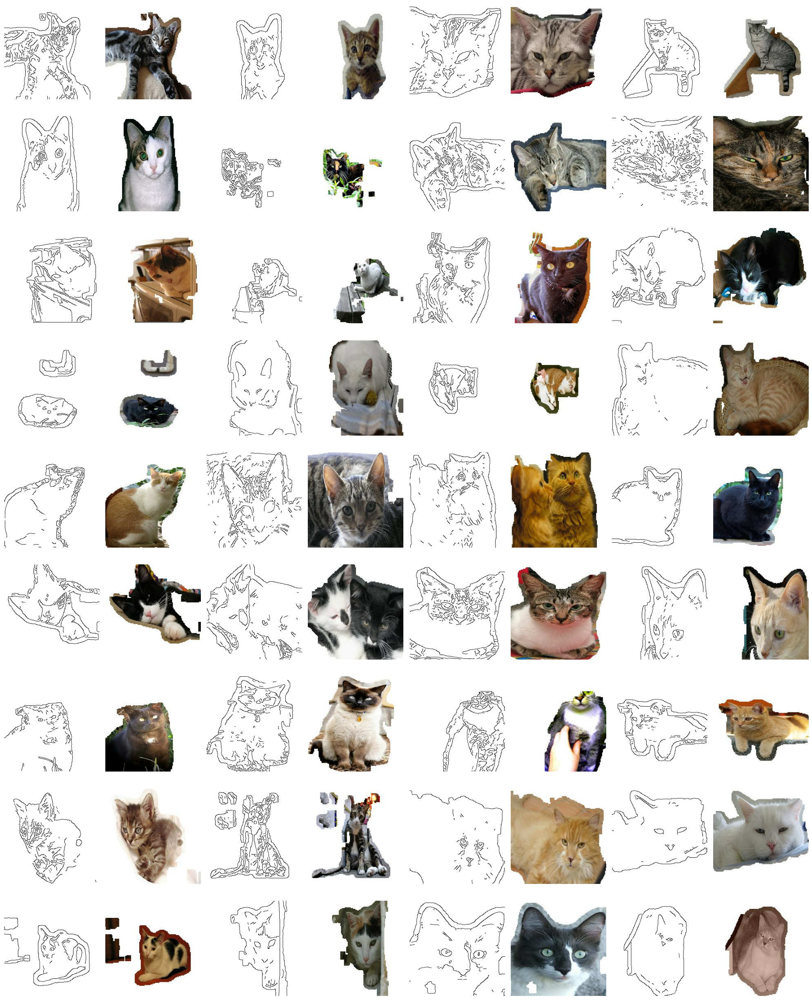

In [8]:
# Randomly load images from the dataset
n_images_to_plot = 36
images = Data_Helper.randomly_load_from_directory(DATASET_OUTPUT_PATH, n_images_to_plot)

# Preprocess
preprocessed = []
for image in images:
    image, edges = Image_Utils.preprocess(image, augment=False)
    preprocessed.append(image)
    preprocessed.append(edges)

# Denormalize
preprocessed = Image_Utils.denormalize_batch(preprocessed)

# Plot
Data_Helper.plot(preprocessed, fig_size=(20, 25))

# Free up the memory
del images, preprocessed

# Loading the Dataset

In [9]:
# Load the data (paths only)
dataset = tf.data.Dataset.list_files(f"{DATASET_OUTPUT_PATH}/*.{FILE_EXTENSION}")

In [10]:
# Cache and Shuffle the dataset
dataset = dataset.cache(filename='cache').shuffle(buffer_size=1000)

# Split the dataset
split_index = math.floor(len(dataset) * VALIDATION_SPLIT)
test_ds = dataset.take(split_index)
train_ds = dataset.skip(split_index)


print(f"Number of images in train_data: {len(train_ds)}")
print(f"Number of images in test_data: {len(test_ds)}")

Number of images in train_data: 9894
Number of images in test_data: 99


In [11]:
# Preprocess
train_ds = train_ds.map(lambda path: Image_Utils.load_image(path), num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.map(lambda image: Image_Utils.preprocess(image, augment=True), num_parallel_calls=tf.data.AUTOTUNE)

test_ds = test_ds.map(lambda path: Image_Utils.load_image(path), num_parallel_calls=tf.data.AUTOTUNE)
test_ds = test_ds.map(lambda image: Image_Utils.preprocess(image, augment=False), num_parallel_calls=tf.data.AUTOTUNE)

# Convert to batched dataset
train_ds = train_ds.batch(BATCH_SIZE)       
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)

test_ds = test_ds.batch(6)
test_ds = test_ds.prefetch(tf.data.AUTOTUNE)

# Building the Model

In [12]:
def downsample(filters, inputs, kernel=4, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(mean=KERNEL_INIT_MEAN,
                                               stddev=KERNEL_INIT_STDDEV)
    x = inputs
    x = layers.Conv2D(filters, kernel, strides=(2, 2),
                      padding='same',
                      kernel_initializer=initializer,
                      use_bias=False)(x)
    
    if apply_batchnorm:
        x = layers.BatchNormalization()(x)
        
    x = layers.LeakyReLU(alpha=0.2)(x)
    
    return x

def upsample(filters, inputs, skip_connection=None, kernel=4, apply_dropout=False):
    initializer = tf.random_normal_initializer(mean=KERNEL_INIT_MEAN,
                                               stddev=KERNEL_INIT_STDDEV)
    x = inputs
    
    if skip_connection is not None:
        # Merge on the channel axis
        x = layers.Concatenate(axis=-1)([x, skip_connection])
        
    x = layers.Conv2DTranspose(filters, kernel, strides=(2, 2),
                               padding='same',
                               kernel_initializer=initializer,
                               use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    
    if apply_dropout:
        x = layers.Dropout(0.5)(x)
        
    x = layers.ReLU()(x)
    
    return x

In [13]:
"""
encoder:
C64-C128-C256-C512-C512-C512-C512-C512
decoder:
CD512-CD512-CD512-C512-C256-C128-C64
"""
def build_generator():
    inputs = layers.Input((*IMAGE_SIZE, N_INPUT_CHANNELS))
    
    # Encoder
    down1 = downsample(64, inputs=inputs, apply_batchnorm=False)  # 256 x 256 => 128 x 128
    down2 = downsample(128, inputs=down1)  # 128 x 128 => 64 x 64
    down3 = downsample(256, inputs=down2)  # 64 x 64 => 32 x 32
    down4 = downsample(512, inputs=down3)  # 32 x 32 => 16 x 16
    down5 = downsample(512, inputs=down4)  # 16 x 16 => 8 x 8
    down6 = downsample(512, inputs=down5)  # 8 x 8 => 4 x 4
    down7 = downsample(512, inputs=down6)  # 4 x 4 => 2 x 2
    down8 = downsample(512, inputs=down7)  # 2 x 2 => 1 x 1
    
    # Decoder
    up8 = upsample(512, inputs=down8, skip_connection=None, apply_dropout=True)  # 1 x 1 => 2 x 2
    up7 = upsample(512, inputs=up8, skip_connection=down7, apply_dropout=True)    # 2 x 2 => 4 x 4
    up6 = upsample(512, inputs=up7, skip_connection=down6, apply_dropout=True)    # 4 x 4 => 8 x 8
    up5 = upsample(512, inputs=up6, skip_connection=down5)   # 8 x 8 => 16 x 16
    up4 = upsample(256, inputs=up5, skip_connection=down4)   # 16 x 16 => 32 x 32
    up3 = upsample(128, inputs=up4, skip_connection=down3)   # 32 x 32 => 64 x 64
    up2 = upsample(64, inputs=up3, skip_connection=down2)    # 64 x 64 => 128 x 128
    
    # Final layer with tanh activation
    initializer = tf.random_normal_initializer(mean=KERNEL_INIT_MEAN,
                                               stddev=KERNEL_INIT_STDDEV)   
    up1 = layers.Concatenate(axis=-1)([up2, down1])
    up1 = layers.Conv2DTranspose(N_OUTPUT_CHANNELS, 4, strides=(2, 2),       # 128 x 128 => 265 x 256
                                 padding='same',
                                 kernel_initializer=initializer,
                                 activation='tanh')(up1)
    
    # Build the model
    model = keras.models.Model(inputs=[inputs], outputs=[up1], name="Generator")
    
    return model

In [14]:
"""
The 70 × 70 discriminator architecture is:
C64-C128-C256-C512
"""
def build_discriminator():
    initializer = tf.random_normal_initializer(mean=KERNEL_INIT_MEAN,
                                           stddev=KERNEL_INIT_STDDEV)
        
    input1 = layers.Input((*IMAGE_SIZE, N_INPUT_CHANNELS))   # input => 256 x 256 x 3
    input2 = layers.Input((*IMAGE_SIZE, N_INPUT_CHANNELS))   # input => 256 x 256 x 3
    
    # Merge the inputs on the channel axis
    merged = layers.Concatenate(axis=-1)([input1, input2])     # output => 256 x 256 x 4
    
    # 256 x 256 => 128 x 128
    down1 = downsample(64, inputs=merged, apply_batchnorm=False)  
    
    # 128 x 128 => 64 x 64
    down2 = downsample(128, inputs=down1)    
    
    # 64 x 64 => 32 x 32
    down3 = downsample(256, inputs=down2)    
    
    # 32 x 32 => 16 x 16
    down4 = downsample(512, inputs=down3)  
    
    # Final layer
    patch = layers.Conv2D(1, (4, 4), strides=1,
                          kernel_initializer=initializer,
                         )(down4)
    
    # Build the model
    model = keras.models.Model(inputs=[input1, input2], outputs=[patch], name="Discriminator")
    
    return model

Model: "Generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 64  3072        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 leaky_re_lu (LeakyReLU)        (None, 128, 128, 64  0           ['conv2d[0][0]']                 
                                )                                                         

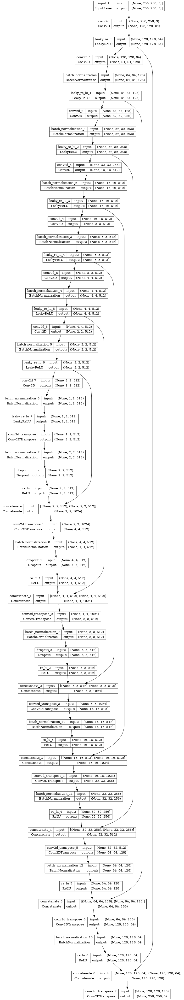

In [15]:
# Build the generator
generator = build_generator()
    
generator.summary()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=65, to_file='generator.png')

Model: "Discriminator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_7 (Concatenate)    (None, 256, 256, 6)  0           ['input_2[0][0]',                
                                                                  'input_3[0][0]']    

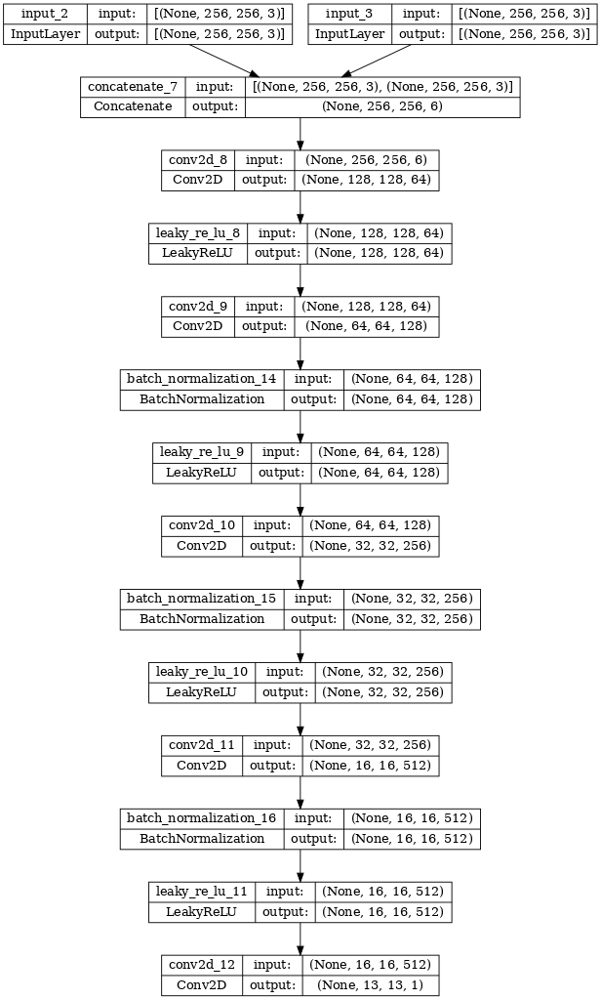

In [16]:
# Build the discriminator
discriminator = build_discriminator()
    
discriminator.summary()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=65, to_file='discriminator.png')

# Training

In [17]:
class Logger():
    def __init__(self, image_log_interval, log_dir=LOG_DIR):
        self.image_log_interval = image_log_interval
        selflog_dir = log_dir
        
        # Save the grids at each step to create a timelaps
        self.grids = []
        
        # Initialize loss lists
        self.gen_total_losses = []
        self.disc_total_losses = []
    
    
    def on_step_end(self, step, logs, test_batch):
        gen_total_loss, disc_total_loss = logs
        
        # Update loss lists
        self.gen_total_losses.append(gen_total_loss)
        self.disc_total_losses.append(disc_total_loss)
        
        # Image logger
        if step % self.image_log_interval == 0:
            self.create_grid(test_batch)
            
            
    def create_grid(self, test_batch, fig_size=(5, 10), save=True):  
        titles = ["Input", "Target", "Generated"]
        input_images, target_images = test_batch
        n_samples = len(input_images)
        
        # Generate a fake image
        generated_images = generator(input_images, training=True)
        
        # Denormalize the images
        input_images = Image_Utils.denormalize_batch(input_images)
        target_images = Image_Utils.denormalize_batch(target_images)
        generated_images = Image_Utils.denormalize_batch(generated_images)
        
        # merge 
        assert len(input_images) == len(target_images) == len(generated_images)
        
        merged = []
        for i in range(len(input_images)):
            merged.append(input_images[i])
            merged.append(target_images[i])
            merged.append(generated_images[i])
        print(len(merged))
        
        # Create a fig
        fig, axes = plt.subplots(nrows=n_samples, ncols=3, figsize=fig_size)
        
        # Plot the images
        for ax, image, title in itertools.zip_longest(axes.flat, merged, titles):
            # Detect the cmap automatically
            cmap = 'gray' if image.shape[-1] == 1 else None
            
            if title is not None:
                ax.set_title(title)
                
            ax.axis("off")
            ax.imshow(image, cmap=cmap)
        
        fig.tight_layout()
        
        if save:
            # Convert the fig to np array
            fig.canvas.draw()     # Render the grid
            grid = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)

            # Get the original dimensions of the figure
            w, h = fig.canvas.get_width_height()

            # Reshape 
            grid = grid.reshape((h, w, 3))
            
            self.grids.append(grid)
        
        # Clear the display
        IPython.display.clear_output(wait=True)
        
        # Plot teh fig
        plt.show()
    
    
    def create_gif(self):
        gif_dir = os.path.join(LOG_DIR, "gifs")

        if not os.path.exists(gif_dir):
            os.makedirs(gif_dir)

        gif_dir = os.path.join(gif_dir, f"{MODEL_NAME} -- {str(uuid.uuid4())}.gif")

        # Create the gif
        imageio.mimsave(gif_dir, self.grids)
        
        return gif_dir
        
logger = Logger(IMAGE_LOG_INTERVAL)

In [18]:
# Define the optimizers
gen_optimizer = optimizers.Adam(lr=generator_lr, beta_1=beta1, beta_2=beta2)
disc_optimizer = optimizers.Adam(lr=discriminator_lr, beta_1=beta1, beta_2=beta2)

# Define the loss functions
BCE = losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_yhat, fake_image, target_image):
    # Calculate GAN loss
    gan_loss = BCE(tf.ones_like(fake_yhat), fake_yhat)
    
    # Calculate L1 loss
    l1_loss = tf.reduce_mean(tf.abs(fake_image - target_image))
    
    # Calculate total loss
    total_loss = gan_loss + (LAMBDA * l1_loss)

    return total_loss, gan_loss, l1_loss


def discriminator_loss(real_yhat, fake_yhat):
    fake_loss = BCE(tf.zeros_like(fake_yhat), fake_yhat)
    real_loss = BCE(tf.ones_like(real_yhat), real_yhat)
    total_loss = fake_loss + real_loss
    
    return total_loss

In [19]:
# Train step
@tf.function
def train_step(step, input_image, target_image):     # based on the paper batch size is 1 
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generator forward pass
        fake_image = generator(input_image, training=True)
        
        # Discriminator forward pass
        real_yhat = discriminator([target_image, input_image], training=True)
        fake_yhat =  discriminator([fake_image, input_image], training=True)
    
        # Calculate losses
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(fake_yhat, fake_image, target_image)
        disc_total_loss = discriminator_loss(real_yhat, fake_yhat)
    
    # Calculate grads
    gen_grads = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
    disc_grads = disc_tape.gradient(disc_total_loss, discriminator.trainable_variables)
    
    # Apply the gradients
    gen_optimizer.apply_gradients(zip(gen_grads, generator.trainable_variables))
    disc_optimizer.apply_gradients(zip(disc_grads, discriminator.trainable_variables))
    
    return int(gen_total_loss), int(disc_total_loss)

In [20]:
# Training
def fit(train_ds, test_ds, steps):
    test_batch = next(iter(test_ds.take(1)))
    
    for step, (input_batch, target_batch) in train_ds.repeat().take(steps).enumerate():
        start = time.time()
        
        # Train step
        gen_total_loss, disc_total_loss = train_step(step, input_batch, target_batch)
        
        # Logging
        end = time.time()
        tqdm.write(f"Step: {step}/{steps} - Generator_Loss: {gen_total_loss:.5f} - Discriminator_Loss: {disc_total_loss:.5f} - Tima taken: {end - start:.5f}", end='\r')

        logger.on_step_end(step,
                           (gen_total_loss, disc_total_loss),
                           test_batch
                          )

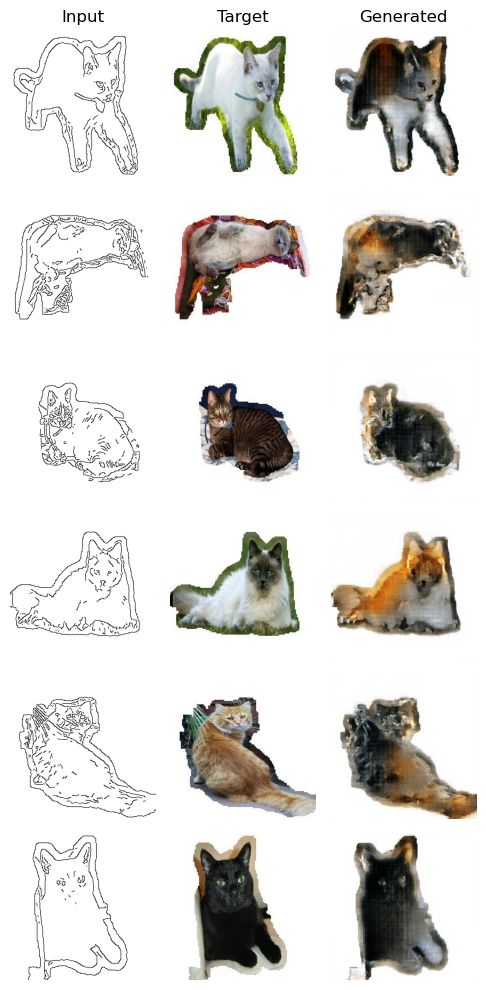

In [21]:
fit(train_ds, test_ds, STEPS)

In [22]:
generator.save("edges2cats.h5")
os.mkdir("tfjs")
tfjs.converters.save_keras_model(generator, "tfjs/edges2cats.json")

In [23]:
shutil.make_archive(f"Model--TFJS--{datetime.now().strftime('%Y%m%d-%H%M%S')}--{str(uuid.uuid4())}",
                    'zip',
                    "/kaggle/working/tfjs"
                   )

'/kaggle/working/Model--TFJS--20230331-160901--729ffdef-9bf2-45ee-bd96-e2f8ceb57f73.zip'

# Evaluation

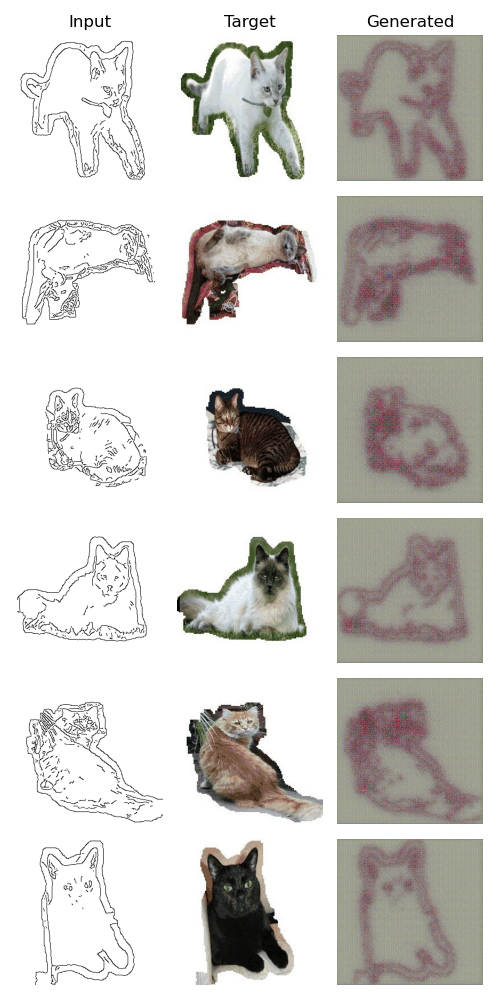

In [24]:
gif_dir = logger.create_gif()
IPython.display.Image(filename=gif_dir)

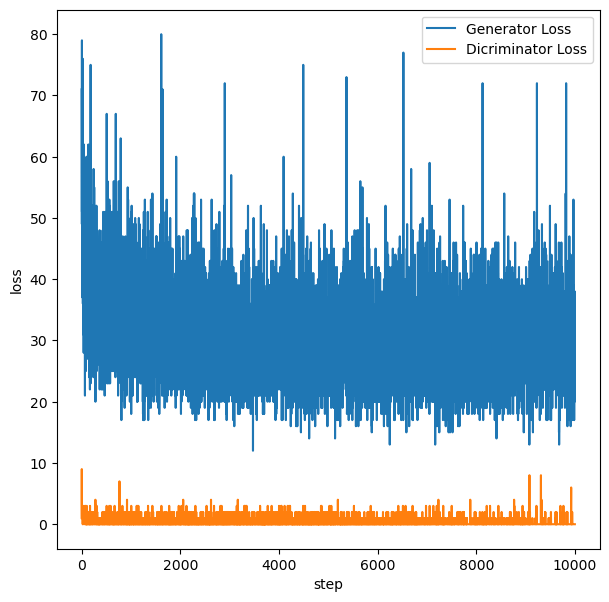

In [25]:
# Plot the losses
plt.figure(figsize=(7, 7))

x = list(range(len(logger.gen_total_losses)))
plt.plot(x, logger.gen_total_losses, label="Generator Loss")
plt.plot(x, logger.disc_total_losses, label="Dicriminator Loss")

plt.legend()
plt.xlabel("step")
plt.ylabel("loss")

plt.show()

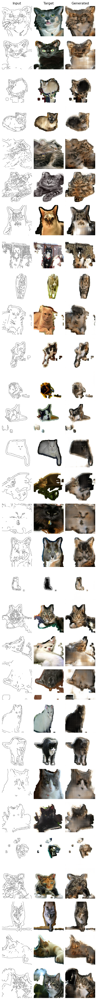

In [26]:
test_batch = next(iter(test_ds.rebatch(30)))
logger.create_grid(test_batch, fig_size=(5, 50), save=False) 

# Sources
https://arxiv.org/abs/1611.07004

https://arxiv.org/abs/1505.04597

https://www.tensorflow.org/tutorials/generative/pix2pix

https://github.com/aladdinpersson/Machine-Learning-Collection/tree/master/ML/Pytorch/GANs/Pix2Pix